In [1]:
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

from keras.optimizers import SGD
from keras.utils import np_utils
from imutils import paths
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.image as mpimg
import cv2
import os
import math
import keras

from keras.preprocessing import image
from keras.models import Model
from keras.optimizers import Adam

from keras.applications import imagenet_utils
from keras.preprocessing.image import load_img,img_to_array

from keras.callbacks import ModelCheckpoint
from keras.applications.imagenet_utils import preprocess_input

from keras.callbacks import LearningRateScheduler
from imutils import paths

from keras.models import load_model
#from keras_radam import RAdam
from keras.utils.vis_utils import plot_model



Using TensorFlow backend.


In [2]:

# grab the list of images in our dataset directory, then initialize
# the list of data (i.e., images) and class images
print("[INFO] loading images...")
imagePaths = list(paths.list_images('./dataset_binary'))
data = []
labels = []
data1= [] 
# loop over the image paths
for imagePath in imagePaths:
	# extract the class label from the filename, load the image, and
	# resize it to be a fixed 64x64 pixels, ignoring aspect ratio
	label = imagePath.split(os.path.sep)[-2]
	#image = load_img(imagePath, target_size=(224, 224))
        # convert the image pixels to a numpy array
	#image = img_to_array(image)
        # reshape data for the model
	#image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
	image = cv2.imread(imagePath,1)
	#image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
	image = cv2.resize(image, (224, 224))
	image1= preprocess_input(image)
	# update the data and labels lists, respectively
	data.append(image1)
	data1.append(image)
	labels.append(label)

data = np.array(data, dtype="float") 

data1 = np.array(data1, dtype="uint8") 
print('loaded data')
#print(len(data))
#print(len(labels))


# convert the data into a NumPy array, then preprocess it by scaling
# all pixel intensities to the range [0, 1]
#data = np.array(data, dtype="float") / 255.0
 
# encode the labels (which are currently strings) as integers and then
# one-hot encode them
le = LabelEncoder()
labels = le.fit_transform(labels)
labels = np_utils.to_categorical(labels, 2)
 
# partition the data into training and testing splits using 75% of
# the data for training and the remaining 25% for testing
(trainX, testX, trainY, testY) = train_test_split(data, labels,
	test_size=0.20, random_state=10)

(trainX1, testX1, trainY1, testY1) = train_test_split(data1, labels,
	test_size=0.20, random_state=10)

[INFO] loading images...
loaded data


In [3]:
model = load_model('./output/binarycervic.hdf5')

In [4]:
#model.summary()

In [5]:


#plot_model(model, to_file='./output/model_plot.png', show_shapes=True, show_layer_names=True)

In [6]:
# import matplotlib.pyplot as plt
# img=mpimg.imread('./output/model_plot.png')
# plt.figure(figsize=(30,120))
# imgplot=plt.imshow(img)

In [7]:
# evaluate the model
score = model.evaluate(testX,testY, verbose=1)


184/184 [==============================] - 18s 96ms/step


In [8]:
print("%s: %.2f%%" % (model.metrics_names[1], score[1]*100))

accuracy: 90.76%


In [9]:
print( model.metrics_names[0], score[0])

loss 151.74667938895848


In [10]:
print( model.metrics_names[2], score[2])

f1 0.9097221493721008


In [11]:
# evaluate the network
print("[INFO] evaluating network...")
predictions = model.predict(testX, batch_size=1)
print(classification_report(testY.argmax(axis=1),
	predictions.argmax(axis=1), target_names=le.classes_))

[INFO] evaluating network...
              precision    recall  f1-score   support

    abnormal       0.89      1.00      0.94       138
      normal       1.00      0.63      0.77        46

    accuracy                           0.91       184
   macro avg       0.95      0.82      0.86       184
weighted avg       0.92      0.91      0.90       184



In [12]:
from sklearn.metrics import confusion_matrix

predictions = model.predict(testX, batch_size=1)
matrix = confusion_matrix(testY.argmax(axis=1), predictions.argmax(axis=1))
print(matrix)

[[138   0]
 [ 17  29]]


<Figure size 432x288 with 0 Axes>

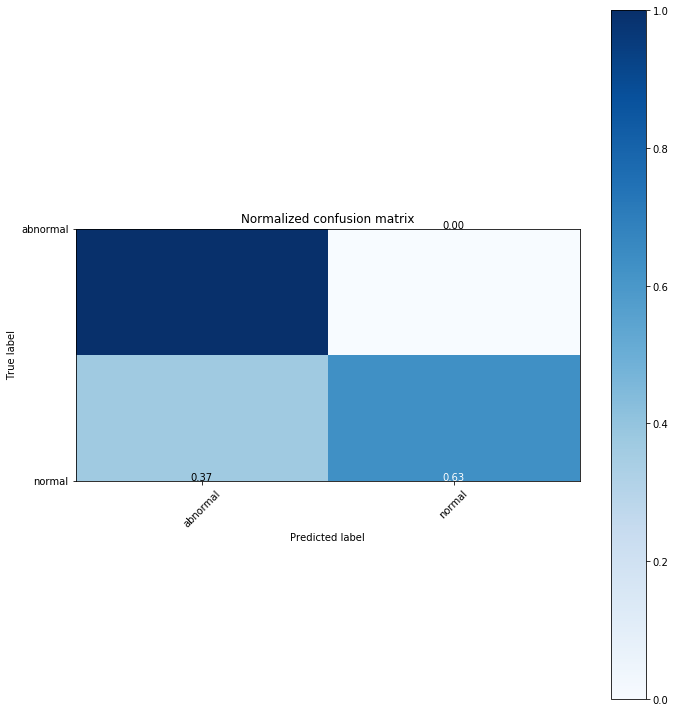

In [13]:
from sklearn.metrics import confusion_matrix
import itertools

class_names=['abnormal','normal']
def plot_confusion_matrix(cm, classes, title='Confusion matrix', cmap=plt.cm.Blues):
    cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    plt.figure(figsize=(10,10))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()
    
# compute confusion matrix
cnf_matrix = confusion_matrix(testY.argmax(axis=1),  predictions.argmax(axis=1))
np.set_printoptions(precision=2)

# plot normalized confusion matrix
plt.figure()
plot_confusion_matrix(cnf_matrix, classes=class_names, title='Normalized confusion matrix')
plt.show()

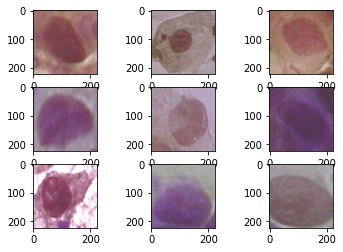

In [14]:

from matplotlib import pyplot as plt
plt.title('Test sample images')
for i in range(9):
    plt.subplot(330 + 1 +i)
    plt.imshow(testX1[i],cmap='gray')


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Text(0.5, 1.0, 'pre-processing sample images')

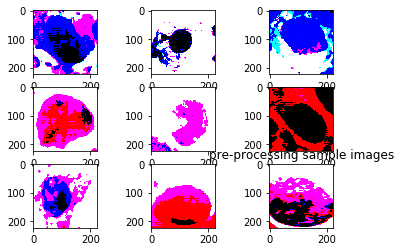

In [15]:

from matplotlib import pyplot as plt
for i in range(9):
    plt.subplot(330 + 1 +i)
    plt.imshow(testX[i],cmap='gray')
plt.title('pre-processing sample images')

In [16]:
# pred = model.predict(testX, batch_size=1)
# print(testY.argmax(axis=1))
# print(pred.argmax(axis=1))

/home/thamizharasi/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


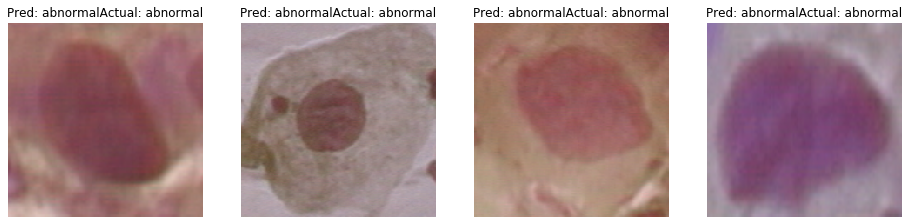

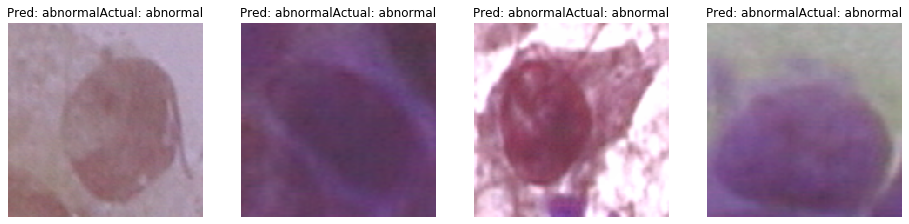

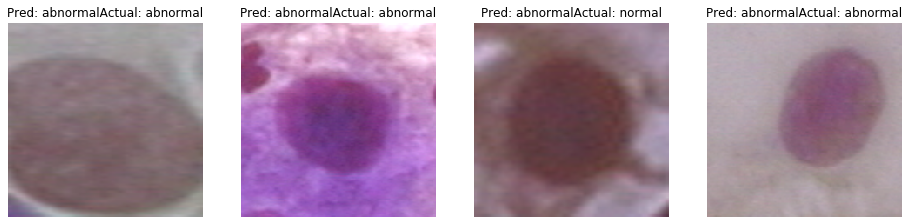

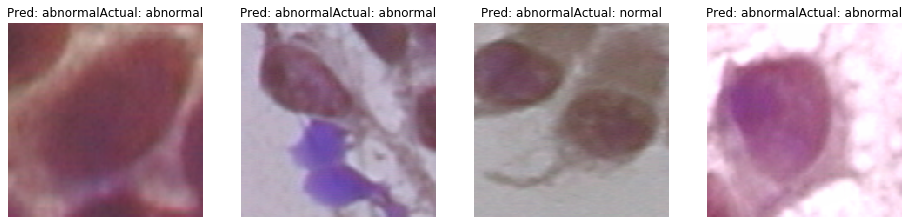

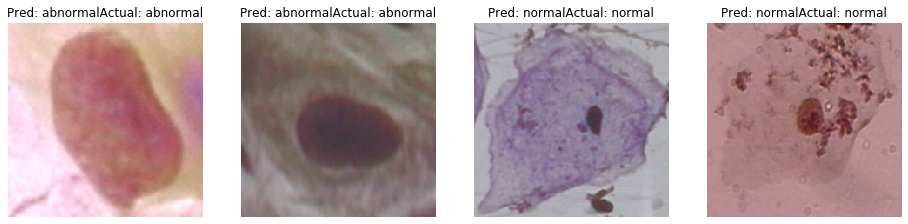

...

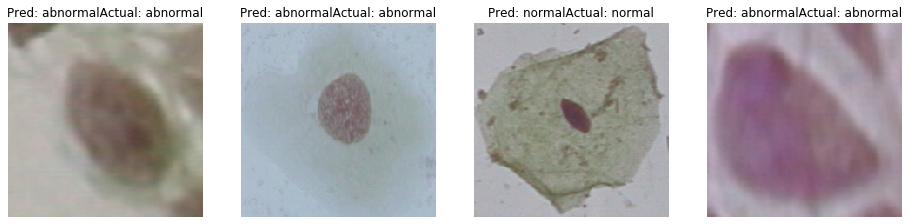

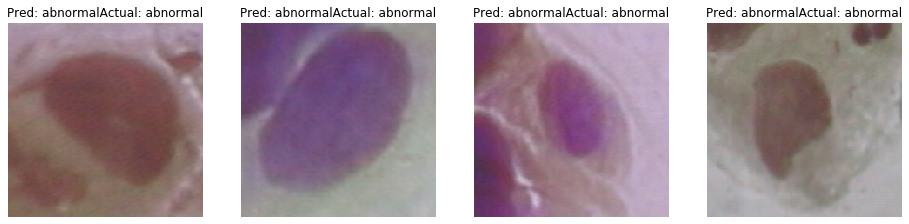

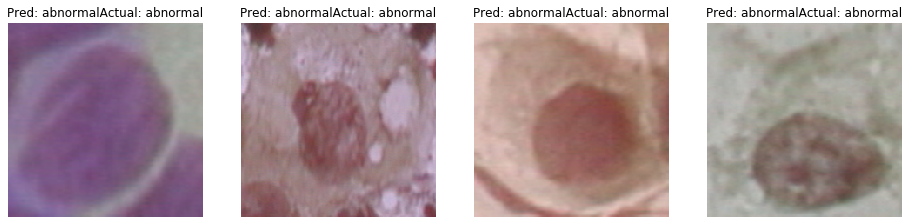

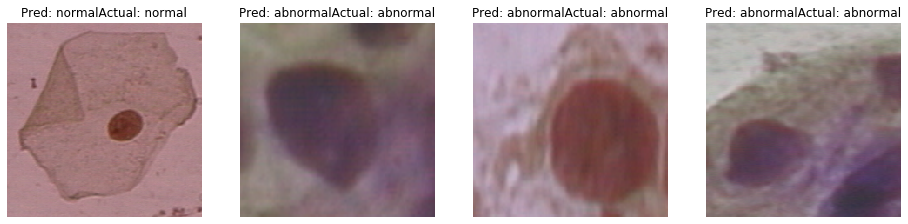

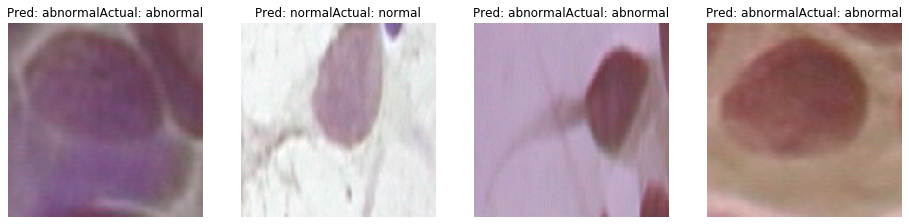

In [18]:
import matplotlib.cm
from matplotlib import pyplot as plt
imgcounter=0
for j in range(45):
# print(batch, (Xi, Xj, label))
    f, axarr = plt.subplots(1, 4, figsize=(16,4))
    f.subplots_adjust(hspace=0.3)

    #print('Row '+str(j))
    for i in range(4):
        if predictions.argmax(axis=1)[imgcounter]==0:
            prediction='abnormal'
        else:
            prediction='normal'
        if testY.argmax(axis=1)[imgcounter]==0:
            display='abnormal'
        else:
            display='normal'
        axarr[i].set_title('Pred: ' + prediction+"Actual: " + display)
        axarr[i].imshow(testX1[imgcounter])
        axarr[i].set_axis_off()

        #axarr[1,i].set_title("Actual: " + display)
        #axarr[1,i].imshow(testX1[imgcounter], cmap=matplotlib.cm.Greys_r)
        #axarr[1,i].set_axis_off()
        imgcounter=imgcounter+1
plt.show()